In [140]:
import numpy as np
from typing import Set, Callable, Dict
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.sparse import dok_matrix
import pickle

# Value iteration code using bellman's equation

In [63]:
# Define the value iteration algorithm as a function
def value_iteration(S: Set, A: Set, P: Callable, R: Callable, gamma: float, max_iterations: int,
                    bellman_eq: Callable, V_init: Dict = None, theta: float = None) -> Dict:
    '''
    Implements the value iteration algorithm to solve a MDP with given
    set of states and actions, transition probabilities, reward function, 
    and discount factor (gamma)

    Arguments
    -----------
    S: Set of states for the MDP.
    A: Set of actions for the MDP.
    P: A function which calculates P(s'|s,a), the probability of transitioning
        to state s' given we are in state s and execute action a.
    R: A function which calculates R(s,a), the reward obtainined if action a is 
        executed while in state s.
    gamma: Discount factor for calculating the next value function in the MDP.
    max_iterations: maximum number of iterations of value function calculations.
    bellman_eq: a function defining the value function update at each iteration.
    V_init: A dictionary to store the initialised values for all states.
    theta: Threshold value to check convergence of the value function 
        to ensure minimum value function update across all states per iteration.

    Output
    -----------
    output_dict: Dictionary containing the optimal policy dictionary and final value function dictionary for all states
    '''

    # Dictionaries containing value function entries for each state
    Vk = dict([(s, 0) for s in S]) if V_init is None else V_init
    V_next = dict([(s, 0) for s in S])

    # Dictionary to store optimal policy for each state
    policy = dict([(s, 0) for s in S])

    k = 0 # iteration counter

    while k < max_iterations: # Iteration termination condition
        # print(Vk)
        delta = 0       # Factor to check convergence of value function
        k = k+1         # Increment iterations
        for s in S:     # Update value function for each state in new iteration
            V_next[s] = max(bellman_eq(s, A, P, R, Vk).values())
            delta = max(delta, abs(V_next[s] - Vk[s]))
        Vk = V_next      # Update penultimate value function for all states for next iteration
        if theta != None and delta < theta: # Convergence (termination) condition for value function (if applicable)
            break

    for s in S: # Store optimal policy for each state
        policy[s] = max(bellman_eq(s, A, P, R, Vk), key = bellman_eq(s, A, P, R, Vk).get)

    return {"optimal_policy": policy, "value_function": V_next}

# Applying value iteration to Piglet

In [64]:
GOAL=2
S = set()
for i in range(GOAL):
    for j in range(GOAL):
        for k in range(GOAL):
            # Skip if a player has already won
            if i+k >= GOAL:
                continue
            S.add((i, j, k))
            
nonwinning_S = S.copy()
# Add terminal win states
S.add(("Win", "Lose", 0))

A = {"roll", "hold"}


def bellman_piglet(s, A, P, R, V, GOAL=2):
    values = dict((a, 0) for a in A)
    i, j, k = s
    if i == "Win":
        values["hold"] = 1
        return values
    
    for a in A:
        if a == "roll":
            s_heads = ("Win", "Lose", 0) if i + k + 1 >= GOAL else (i, j, k+1)
            values[a] = (1 - V[(j, i, 0)] + V[s_heads])/2
        elif a == "hold":
            values[a] = 1 - V[(j, i+k, 0)]
            
    return values


## Results for applying piglet with value iteration


In [65]:
V_init = dict([(s, 0) for s in S])
V_init[("Win", "Lose", 0)] = 1

results = value_iteration(S=S, A=A, P=None, R=None, 
                          gamma=1, max_iterations=100, 
                          V_init=V_init, bellman_eq=bellman_piglet)
policy = results["optimal_policy"]
prob_winning = results["value_function"]
for s in S:
    print(f"P(winning at {s}) if {policy[s]}: {prob_winning[s]:.4f}")

P(winning at (1, 1, 0)) if roll: 0.6667
P(winning at (0, 1, 0)) if roll: 0.4000
P(winning at ('Win', 'Lose', 0)) if hold: 1.0000
P(winning at (0, 0, 0)) if roll: 0.5714
P(winning at (1, 0, 0)) if roll: 0.8000
P(winning at (0, 0, 1)) if roll: 0.7143
P(winning at (0, 1, 1)) if roll: 0.6000


In [66]:
V_init = dict([(s, 0) for s in S])
V_init[("Win", "Lose", 0)] = 1

piglet_prob_winning = dict((s, []) for s in nonwinning_S)
for its in range(25):
    value_function = value_iteration(S=S, A=A, P=None, R=None, 
                          gamma=1, max_iterations=its, 
                          V_init=V_init, bellman_eq=bellman_piglet)["value_function"]
    for key, value in piglet_prob_winning.items():
        piglet_prob_winning[key].append(value_function[key])

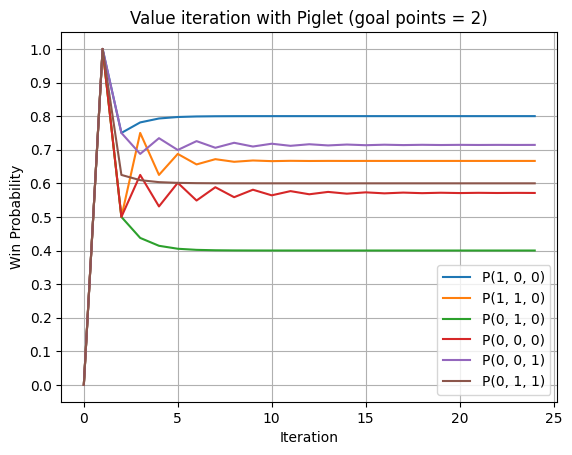

In [67]:
fig, ax = plt.subplots()
for state, probs in piglet_prob_winning.items():
    plt.plot(probs, label=rf"P{str(state)}")
plt.legend()
plt.yticks(np.arange(0, 1.1, 0.1))
plt.xlabel("Iteration")
plt.ylabel("Win Probability")
plt.title("Value iteration with Piglet (goal points = 2)")
plt.grid()
plt.show()

# Applying Value iteration to PIG

In [90]:
target = 10
die_size=6

def generate_PIG_states(target):
    S = set()
    for i in range(target):
        for j in range(target):
            for k in range(target):
                # Skip if player has already won
                if i+k>= target:
                    continue
                S.add((i, j, k))

    nonterminal_S = S.copy()      # non terminal states
    S.add(("Win", "Lose", 0))    # Add terminal (winning) states

    return S, nonterminal_S

def bellman_PIG_func_generator(target, die_size):
    def bellman_PIG(s, A, P, R, V, target=target, die_size=die_size):
        values = dict((a, 0) for a in A)
        i, j, k = s

        if i == "Win":
            values["hold"] = 1
            return values
        
        for a in A:
            if a == "roll":
                V_good_roll = [V[(i, j, k+r)] if i + k + r < target 
                               else V[("Win", "Lose", 0)] for r in range(2,7)]
                values[a] = (1 - V[(j, i, 0)] + sum(V_good_roll))/die_size
            elif a == "hold":
                values[a] = 1 - V[(j, i+k, 0)]

        return values
    return bellman_PIG

In [146]:
# Problem parameters
target=100
S, nonwinning_S = generate_PIG_states(target)
A = {"roll", "hold"}
bellman_PIG = bellman_PIG_func_generator(target=target, die_size=6)
V_init = dict([(s, 0) for s in S])
V_init[("Win", "Lose", 0)] = 1

# Apply value iteration
results = value_iteration(S=S, A=A, P=None, R=None,
                          gamma=1, max_iterations=100,
                          bellman_eq=bellman_PIG, V_init=V_init)
policy = results["optimal_policy"]
prob_winning = results["value_function"]
prob_winning[(0,0,0)]


0.5305898739683853

In [ ]:
# # Store the dictionary of results in a pickle file - recommended to uncomment only when a better solution is found
# with open(f'PIG_results_target_{target}.pkl', 'wb') as f:
#     pickle.dump(results, f)

# PIG value iteration results

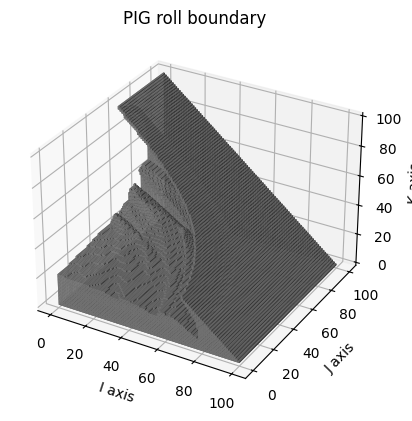

In [155]:
target=target
# Define the grid bounds 
grid_x = target
grid_y = target
grid_z = target

# Create a 3D array (grid) of zeros
volume = np.zeros((grid_x, grid_y, grid_z))

# Fill the grid with ones where the value is "roll"
for (i, j, k), value in policy.items():
    if value == "roll":
        volume[i, j, k] = 1


# Create the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the volume where the value is "roll"
# We use plot_voxels to create a volumetric surface
ax.voxels(volume, facecolors='grey', alpha=1)

# Set labels and title
ax.set_xlabel('I axis')
ax.set_ylabel('J axis')
ax.set_zlabel('K axis')
ax.set_title('PIG roll boundary')

# Show the plot
plt.show()


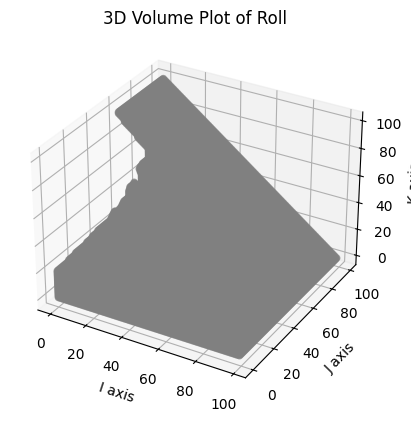

In [149]:
# Define the grid bounds
grid_x, grid_y, grid_z = target, target, target

# Use a dictionary for sparse representation
volume = {}

# Fill the grid where the value is "roll"
for (i, j, k), value in policy.items():
    if value == "roll":
        volume[(i, j, k)] = 1

# Extract the coordinates to plot
x, y, z = zip(*volume.keys())

# Plot only the non-zero points
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='grey', alpha=0.7)

# Set labels and title
ax.set_xlabel('I axis')
ax.set_ylabel('J axis')
ax.set_zlabel('K axis')
ax.set_title('3D Volume Plot of Roll')
plt.show()


In [151]:
# Define the grid bounds (You can adjust this based on your data range)
grid_x = target
grid_y = target
grid_z = target

# Create a 3D array (grid) of zeros
volume = np.zeros((grid_x, grid_y, grid_z))

# Fill the grid with ones where the value is "roll"
for (i, j, k), value in results["optimal_policy"].items():
    if value == "roll":
        volume[i, j, k] = 1

x, y, z = np.indices(volume.shape)

# Create the 3D volume plot with Plotly
fig = go.Figure(data=go.Volume(
    x=x.flatten(),  # x coordinates of 'roll' locations
    y=y.flatten(),  # y coordinates of 'roll' locations
    z=z.flatten(),  # z coordinates of 'roll' locations
    value=volume.flatten(),  # Values are 1 where "roll" occurs
    opacity=0.9,              # Control transparency, higher means less transparent
    surface_count=8,         # Controls how many isosurfaces to display
    # colorscale="greys",       # Color map for the volume (red hues)
))

# Set axis labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='I axis',
        yaxis_title='J axis',
        zaxis_title='K axis'
    ),
    title="3D Volume Plot of Roll"
)

# Show the interactive plot
fig.show()